In [102]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

In [103]:
def import_img(img_path,img_rows):
    img = tf.keras.preprocessing.image.load_img(img_path)
    img = tf.keras.preprocessing.image.img_to_array(img)
    (height, width, channels) = img.shape
    img_cols = img_rows*(width/height)
    img = tf.image.resize(img,size=(img_rows,int(img_cols)))
    return img

def preprocess_img(img):
    img = tf.expand_dims(img,axis=0)
    img = tf.keras.applications.vgg19.preprocess_input(img)
    return img

def show(*images,figsize=None):
    plots = len(images)
    iter = 0
    fig, objects = plt.subplots(1,plots,figsize=figsize)
    for i in tuple(objects):
        i.imshow(images[iter])
        i.axis(False)
        iter+=1
    plt.show()
    
def content_fn(base_img,combination_img):
    return tf.reduce_sum(tf.square(base_img-combination_img))

def gram_matrix(img):
    img = tf.transpose(img,(2,0,1))
    img = tf.reshape(img, shape=(tf.shape(img)[0],-1))
    matrix = tf.matmul(img,img,transpose_b=True)
    return matrix
    
def style_fn(style_img,combination_img):
    style_gram = gram_matrix(style_img)
    combination_gram = gram_matrix(combination_img)
    return tf.reduce_sum(tf.square(style_gram-combination_gram)) / (4*9*(400**4))
    
def deprocess_image(img):
    img = tf.squeeze(img).numpy()
    img[:, :, 0] += 103.939
    img[:, :, 1] += 116.779
    img[:, :, 2] += 123.68
    img = img[:, :, ::-1]
    img = np.clip(img, 0, 255).astype("uint8")
    return img

In [104]:
content_path = 'Tensorflow dump/contentimage.jpg'
style_path = "Tensorflow dump/styleimage.jpg"

content_img = import_img(content_path,img_rows=400)
style_img = import_img(style_path,img_rows=400)
combination_img = import_img(content_path,img_rows=400)

content_img = preprocess_img(content_img)
style_img = preprocess_img(style_img)
combination_img = tf.Variable(preprocess_img(combination_img))

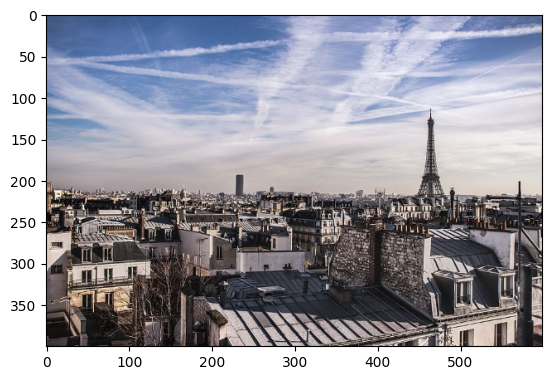

In [105]:
plt.imshow(deprocess_image(combination_img.numpy())/255.0)

In [106]:
vgg = tf.keras.applications.vgg19.VGG19(weights='imagenet',include_top=False)
vgg.trainable = False
class modVGG(tf.keras.Model):
    def __init__(self):
        super(modVGG,self).__init__()
        self.choose = "style"
        self.chosen_style = ['block1_conv1','block2_conv1','block3_conv1','block4_conv1','block5_conv1']
        self.chosen_content = 'block5_conv2'
        self.model = vgg
    def call(self,x):
        features = []
        if self.choose=='style':
            for l in self.model.layers:
                x = l(x)
                if l.name in self.chosen_style:
                    features.append(x)
        elif self.choose=='content':
            for l in self.model.layers:
                x = l(x)
                if l.name is self.chosen_content:
                    features = x
        return features
trainer = modVGG()

In [107]:
lr_decay = tf.keras.optimizers.schedules.ExponentialDecay(initial_learning_rate=100,decay_rate=0.96,decay_steps=100)
optim = tf.keras.optimizers.Adam(learning_rate=lr_decay)
style_weight = 2e-7
content_weight = 2.5e-8
epochs = 200
for epoch in range(1,epochs+1):
    with tf.GradientTape() as tape:
        tape.watch(combination_img)
        trainer.choose = 'style'
        style_features = trainer(style_img)
        combination_features_wrt_style = trainer(combination_img)
        trainer.choose = 'content'
        content_features = trainer(content_img)
        combination_features_wrt_content = trainer(combination_img)
        # Content loss...
        content_loss = content_weight*content_fn(content_features,combination_features_wrt_content)
        # Style loss...
        style_loss = 0
        for style_feat, combination_feat in zip(style_features,combination_features_wrt_style):
            style_feat = tf.squeeze(style_feat)
            combination_feat = tf.squeeze(combination_feat)
            style_loss+=style_weight*style_fn(style_feat,combination_feat)
        total_loss = style_loss + content_loss
    if epoch%100==0:
        print(f"Iteration: {epoch} | content loss: {content_loss} | style loss: {style_loss} | total loss: {total_loss}")
    grads = tape.gradient(total_loss,[combination_img])
    optim.apply_gradients(zip(grads,[combination_img]))

InvalidArgumentError: cannot compute Pow as input #1(zero-based) was expected to be a int32 tensor but is a double tensor [Op:Pow]

(-0.5, 598.5, 399.5, -0.5)

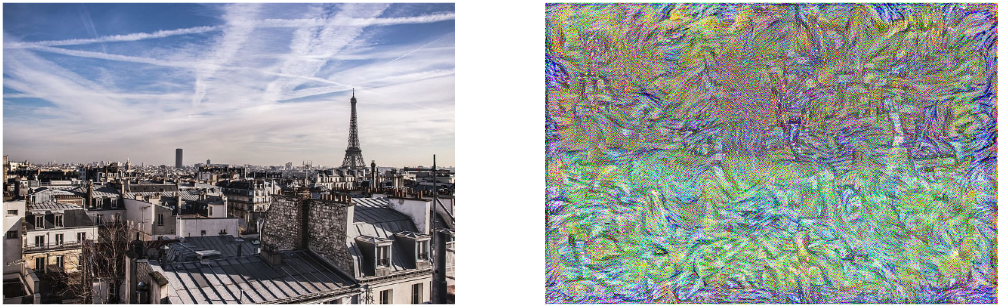

In [ ]:
fig, (x,y) = plt.subplots(1,2,figsize=(50,50))
x.imshow(deprocess_image(content_img.numpy()))
y.imshow(deprocess_image(combination_img.numpy()))
x.axis(False)
y.axis(False)

In [ ]:
for n,l in enumerate(vgg.layers):
    print(n,l.name)

0 input_8
1 block1_conv1
2 block1_conv2
3 block1_pool
4 block2_conv1
5 block2_conv2
6 block2_pool
7 block3_conv1
8 block3_conv2
9 block3_conv3
10 block3_conv4
11 block3_pool
12 block4_conv1
13 block4_conv2
14 block4_conv3
15 block4_conv4
16 block4_pool
17 block5_conv1
18 block5_conv2
19 block5_conv3
20 block5_conv4
21 block5_pool
